# Graph learning

The objective of this notebook is to present different analysis methods for graph.
They are implementations of algorithms presented on the UTC master lecture on graph learning (AOS6) taught by Jean-Benoist Leger. It is not a global project but more a compilation of homeworks.

# Part 1 Spectral clustering

In order to understand a method, it is crucial to experiment on simulated data. First, data of low dimension to have the intuition of the method. Secondly with bigger dimension to be sure that it is scalable.

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import networkx as nx
from sklearn.cluster import KMeans

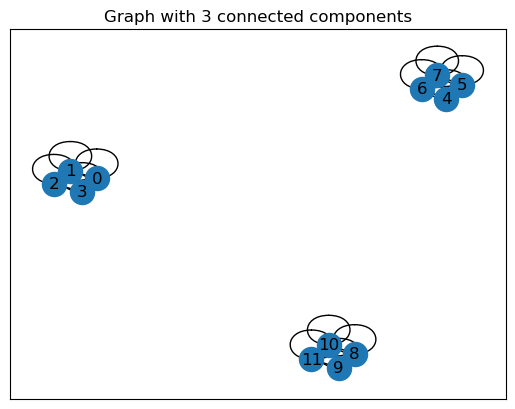

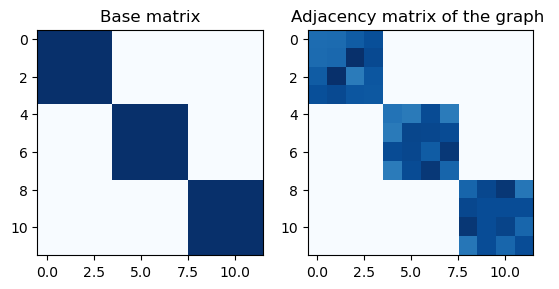

In [2]:
basemat = np.kron(np.eye(3),np.ones((4,4)))

M = basemat * np.random.uniform(.7,1, size=(12,12))
M[np.triu_indices_from(M)] = M.T[np.triu_indices_from(M)]

# Plotting adjacency matrix representation of graphs
nx.draw_networkx(nx.from_numpy_array(M))
plt.title("Graph with 3 connected components")
plt.show()

plt.subplot(121)
plt.imshow(basemat, cmap='Blues')
plt.title("Base matrix")
plt.subplot(122)
plt.imshow(M, cmap='Blues')
plt.title("Adjacency matrix of the graph ")
plt.show()

On the graph we see 3 distinct communities (connected components). How to recognize them?

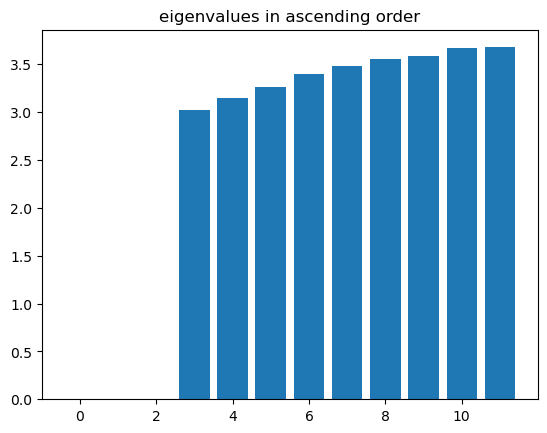

eigenvalues: [-4.42820501e-16  2.07310308e-16  5.67852309e-16]


In [3]:
L = np.diag(np.sum(M, axis=1)) - M
eigvals, eigvect = np.linalg.eigh(L)

plt.bar(range(12),eigvals)
plt.bar(range(3),eigvals[:3], color='r')
plt.title("eigenvalues in ascending order")
plt.show()
print(f"eigenvalues: {eigvals[:3]}")

We see that the the L (laplacian) matrix have 3 nul eigenvalues (eigenvalues with numerical 0).
Actually it is proven that the number of connected component is equal to the nul eigenvalues of the Laplacian matrix

In [4]:
p_lowest = eigvect[:,:3]
print(p_lowest)

[[0.5 0.  0. ]
 [0.5 0.  0. ]
 [0.5 0.  0. ]
 [0.5 0.  0. ]
 [0.  0.  0.5]
 [0.  0.  0.5]
 [0.  0.  0.5]
 [0.  0.  0.5]
 [0.  0.5 0. ]
 [0.  0.5 0. ]
 [0.  0.5 0. ]
 [0.  0.5 0. ]]


We have taken the eigenvectors of the Laplacian matix associated to the nul eigenvalues. 

These eigenvectors could be used as embedings. 

With these embedings we apply a clustering method (K-means is perfect) to find clusters of nodes that correspond to the communities

In [5]:
kmeans = KMeans(n_clusters=3, random_state=0, n_init=10)
y_pred = kmeans.fit_predict(p_lowest)
print(y_pred)

[2 2 2 2 0 0 0 0 1 1 1 1]


We see the label predicted let make sure that they are appropriate

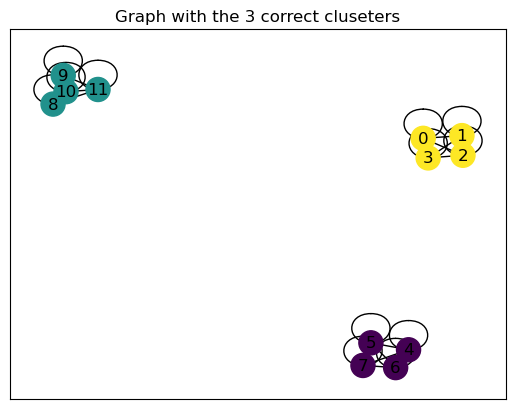

In [6]:
nx.draw_networkx(nx.from_numpy_array(M), node_color=y_pred)
plt.title("Graph with the 3 correct cluseters")
plt.show()

We see that the communities have been recovered perfectly with this method of spectral clustering.

A theoretical result is that the connected components (communities without link) will be perfectly recovered. 

However in real cases graph have only one big connected component (all nodes are connected) and communities are links together. We will see that we can still apply the same method.

In this simulation data, all the node are connected (there is only one connected component) but we see that there is 3 connected components

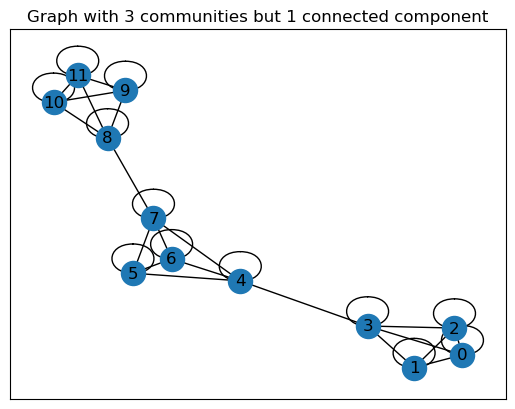

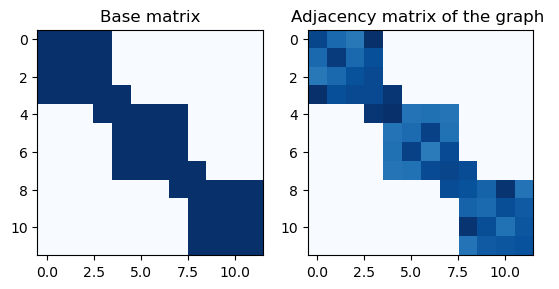

In [7]:
basemat = np.kron(np.eye(3),np.ones((4,4)))
basemat[3,4]=basemat[4,3]=1
basemat[7,8]=basemat[8,7]=1

M = basemat * np.random.uniform(.7,1, size=(12,12))
M[np.triu_indices_from(M)] = M.T[np.triu_indices_from(M)]

# Plotting adjacency matrix representation of graphs
nx.draw_networkx(nx.from_numpy_array(M))
plt.title("Graph with 3 communities but 1 connected component")
plt.show()

plt.subplot(121)
plt.imshow(basemat, cmap='Blues')
plt.title("Base matrix")
plt.subplot(122)
plt.imshow(M, cmap='Blues')
plt.title("Adjacency matrix of the graph ")
plt.show()

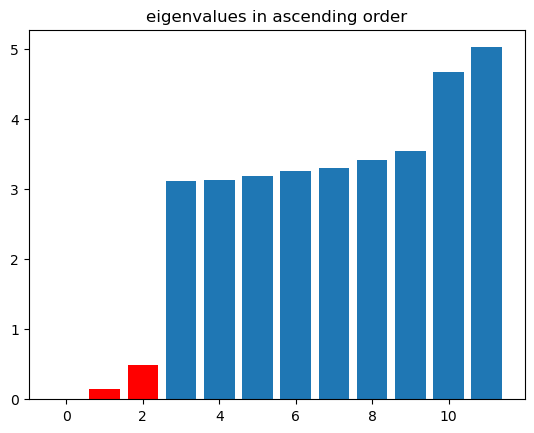

eigenvalues: [1.71737624e-16 1.50188386e-01 4.90611807e-01]


In [8]:
L = np.diag(np.sum(M, axis=1)) - M
eigvals, eigvect = np.linalg.eigh(L)

plt.bar(range(12),eigvals)
plt.bar(range(3),eigvals[:3], color='r')
plt.title("eigenvalues in ascending order")
plt.show()
print(f"eigenvalues: {eigvals[:3]}")

We see that there is only one eigenvalue of Laplacian matrix corresponding to the connected components.

We can still to choose to take embeddings from the 3 eigenvector corresponding to the 3 lowest eigenvalues.

In [9]:
eigvect[:,:3]

array([[ 0.28867513, -0.3586244 , -0.23654294],
       [ 0.28867513, -0.36080552, -0.24188483],
       [ 0.28867513, -0.36042019, -0.24095015],
       [ 0.28867513, -0.30086758, -0.1112045 ],
       [ 0.28867513, -0.0855499 ,  0.31191125],
       [ 0.28867513, -0.01069035,  0.47706123],
       [ 0.28867513, -0.00782539,  0.46964127],
       [ 0.28867513,  0.06210347,  0.33376525],
       [ 0.28867513,  0.30505822, -0.09120534],
       [ 0.28867513,  0.3732232 , -0.22500298],
       [ 0.28867513,  0.36973265, -0.21739376],
       [ 0.28867513,  0.37466578, -0.2281945 ]])

We see that the first column doesn't give any information. But we can keep the 2 other ones and make a K-means on them.

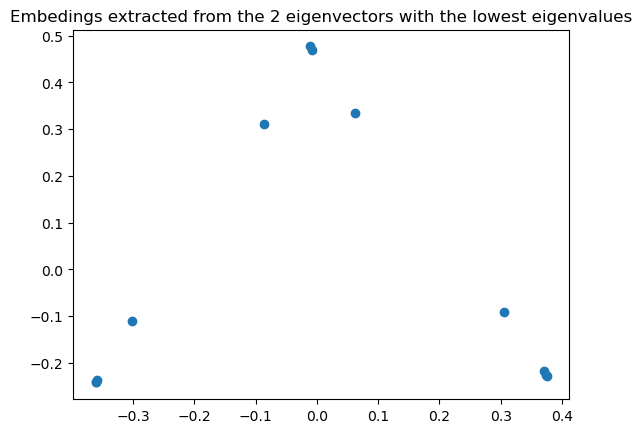

In [10]:
plt.figure()
plt.scatter(eigvect[:,1], eigvect[:,2])
plt.title("Embedings extracted from the 2 eigenvectors with the lowest eigenvalues")
plt.show()

We see that the embeddings could be clustered. Let do the KNN to retrieve them.

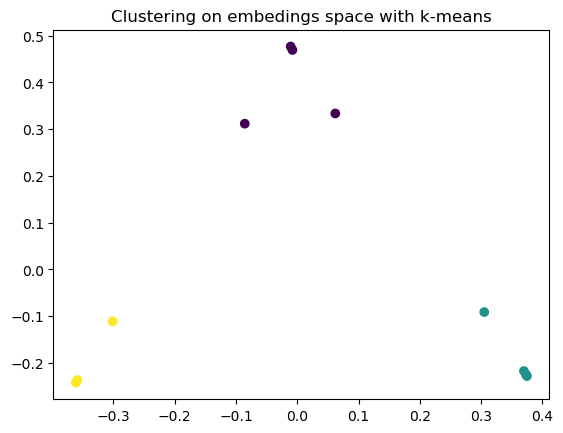

In [11]:
p_lowest = eigvect[:,1:3]
kmeans = KMeans(n_clusters=3, random_state=0, n_init=10)
y_pred = kmeans.fit_predict(p_lowest)

plt.figure()
plt.scatter(eigvect[:,1], eigvect[:,2], c=y_pred)
plt.title("Clustering on embedings space with k-means")
plt.show()


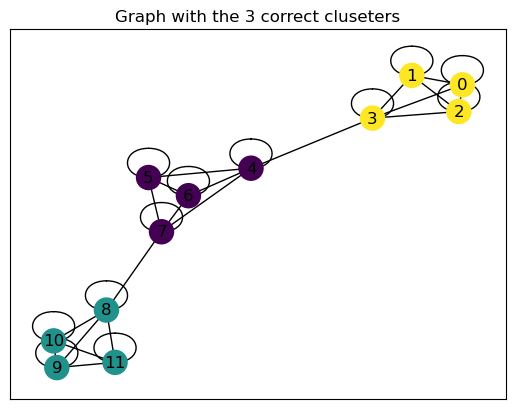

In [12]:
nx.draw_networkx(nx.from_numpy_array(M), node_color=y_pred)
plt.title("Graph with the 3 correct cluseters")
plt.show()

The 3 clusters are retrieved

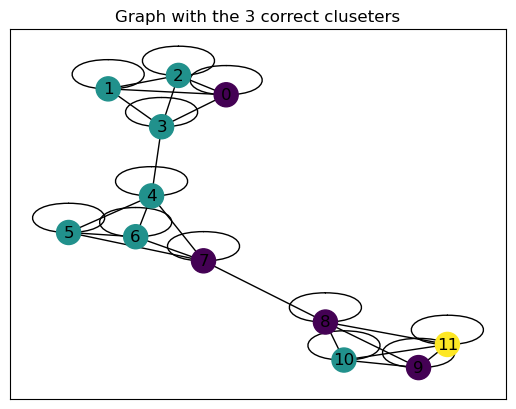

In [13]:
p_lowest = eigvect[:,:10]
kmeans = KMeans(n_clusters=3, random_state=0, n_init=10)
y_pred = kmeans.fit_predict(p_lowest)

nx.draw_networkx(nx.from_numpy_array(M), node_color=y_pred)
plt.title("Graph with the 3 correct cluseters")
plt.show()

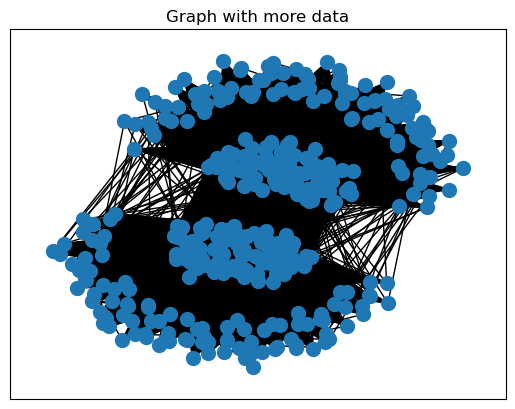

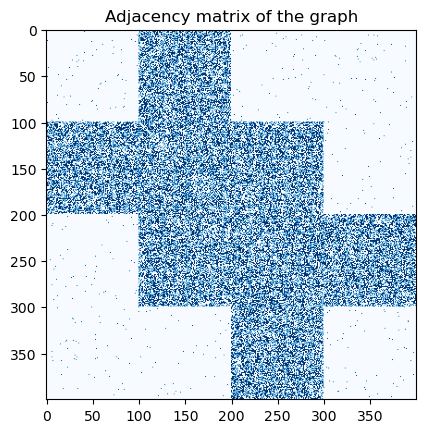

In [14]:
edges = np.loadtxt('AOS6exampleSC.txt', delimiter='\t', dtype=int)
dim = max(max(edges[:,0]), max(edges[:,1]))+1
M = np.zeros((dim,dim))

for i,j in edges:  
    M[i,j] = M[j,i] = 1


nx.draw_networkx(nx.from_numpy_array(M), with_labels=False, node_size=100)
plt.title("Graph with more data")
plt.show()

plt.imshow(M, cmap='Blues')
plt.title("Adjacency matrix of the graph")
plt.show()

With these data we can observe a very interesting this. How to define a communities?

Basically there is 2 ways to define a community. Lets take some examples.
- You take a graph of friendship between people (friends are connected between them). In this case, the community (a group of friends ) will be a group of nodes densely connected between them.
- You take a graph of account on youtube (there is a link between account when on is subscribed to the other). In this case, there is a graph with leaders (youtubers) and followers (all subscribers). The communities will no more be define as a group of node connected between them but more a group of node that are connected to the same type of nodes.

If we take the first case, we search to find 2 clusters for the example (the top-left and bottom-right).
If we take the second case, we search to find 4 cluster for the example (2 at the center and 2 external).

We will see that actually spectral clustering is suited to find the first case but not the other (however other algorithm can fit the second cases and some can eventually do both).

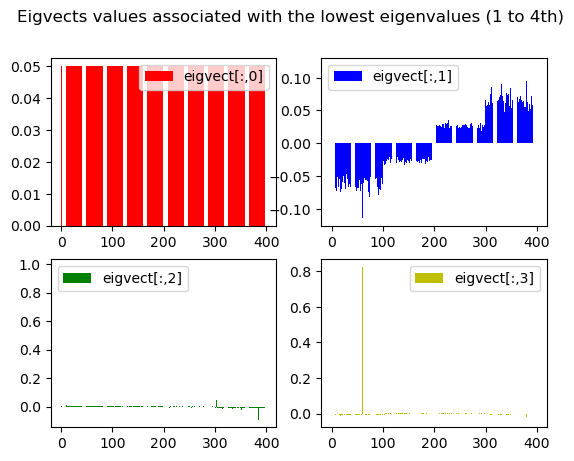

In [15]:
L = np.diag(np.sum(M, axis=0)) - M
eigvals, eigvect = np.linalg.eigh(L)
n = eigvect[:,0].size

plt.subplot(221)
plt.bar(range(n), eigvect[:,0], label="eigvect[:,0]", color='r')
plt.legend()
plt.subplot(222)
plt.bar(range(n), eigvect[:,1], label="eigvect[:,1]", color='b')
plt.legend()
plt.subplot(223)
plt.bar(range(n), eigvect[:,2], label="eigvect[:,2]", color='g')
plt.legend()
plt.subplot(224)
plt.bar(range(n), eigvect[:,3], label="eigvect[:,3]", color='y')
plt.legend()
plt.suptitle("Eigvects values associated with the lowest eigenvalues (1 to 4th)")
plt.show()

We see that the eigenvectors can give us some very different embeddings. For our case the only one that bring valuable information is eigvect[:,1]. It seems to be separable in 2 classes. Let do a clustering on it. 

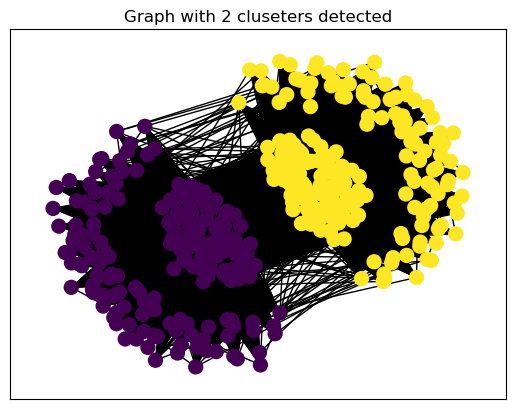

In [16]:
p_lowest = eigvect[:,:2]
kmeans = KMeans(n_clusters=2, random_state=0, n_init=10)
y_pred = kmeans.fit_predict(p_lowest)

nx.draw_networkx(nx.from_numpy_array(M), node_color=y_pred, with_labels=False, node_size=100)
plt.title("Graph with 2 cluseters detected")
plt.show()

We detect well the two communities but as mentioned above the communities are corresponding to the first definition (group of nodes densely connected between them).

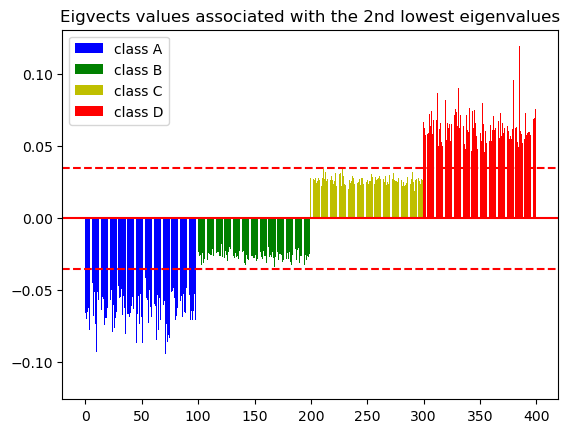

In [17]:
plt.figure()
plt.bar(range(n)[:100], eigvect[:,1][:100], label="class A", color='b')
plt.bar(range(n)[100:200], eigvect[:,1][100:200], label="class B", color='g')
plt.bar(range(n)[200:300], eigvect[:,1][200:300], label="class C", color='y')
plt.bar(range(n)[300:], eigvect[:,1][300:], label="class D", color='r')
# add an horizontal line at x = 0
plt.axhline(y=0, color='r', linestyle='-')
plt.axhline(y=0.035, color='r', linestyle='--')
plt.axhline(y=-0.035, color='r', linestyle='--')

plt.legend()
plt.title("Eigvects values associated with the 2nd lowest eigenvalues")
plt.show()

Actually, we can also use the eigenvector[:,1] to find the second definition of communities. This is because the degree of the nodes is also taken into account in the Laplacian and that there are big differences between the degree of the followers and the stars.

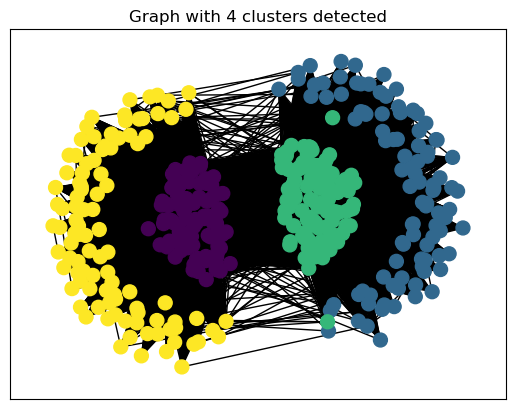

In [18]:
p_lowest = eigvect[:,1].reshape(-1,1)
kmeans = KMeans(n_clusters=4, random_state=0, n_init=10)
y_pred = kmeans.fit_predict(p_lowest)

nx.draw_networkx(nx.from_numpy_array(M), node_color=y_pred, with_labels=False, node_size=100)
plt.title("Graph with 4 clusters detected")
plt.show()

We retrieve the 4 communities. However the algorithm usually use a parameter k to take the k eigenvectors associated to the k lowest eigenvalues and find k clusters. Thus is not designed to performed in detecting this type of communities.

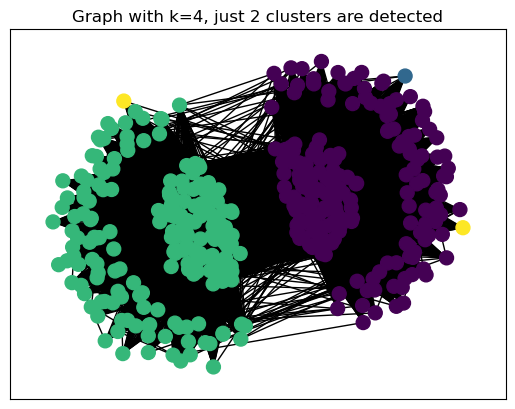

In [19]:
k = 4
p_lowest = eigvect[:,:k]
kmeans = KMeans(n_clusters=k, random_state=0, n_init=10)
y_pred = kmeans.fit_predict(p_lowest)

nx.draw_networkx(nx.from_numpy_array(M), node_color=y_pred, with_labels=False, node_size=100)
plt.title("Graph with k=4, just 2 clusters are detected")
plt.show()

## Spectral clustering sith UnormalizeSC, NgSC, AESC and MCL 


These definitions are mesures on graphs.

In [20]:
def SC(M, k):
    L = np.diag(np.sum(M, axis=0)) - M
    _, eigvect = np.linalg.eigh(L)
    U = eigvect[:, :k]
    kmeans = KMeans(n_clusters=k, random_state=0, n_init=10).fit(U)
    return kmeans.labels_

This is the same algorithm as we see previously. It can also be called non-normalize spectral clustering because compared to some that can be normalized by the degree of the nodes.

In [21]:

def NgSC(M,k):
    L = np.diag(np.sum(M, axis=0)) - M
    dh = M.sum(axis=0)**0.5
    L_sym = L / dh[:,np.newaxis] / dh[np.newaxis,:]


    _, eigvect = np.linalg.eigh(L_sym)
    U = eigvect[:, :k]
    
    U = U / np.linalg.norm(U, axis=0)    
    kmeans = KMeans(n_clusters=k, random_state=0, n_init=10).fit(U)
    return kmeans.labels_

For this spectral clustering there is a normalization (row and column) of the Laplacian by the degree of the nodes. This is the NgSC algorithm.

In [22]:
def AESC(M,k):
    L = np.diag(np.sum(M, axis=0)) - M
    
    dh = M.sum(axis=0)**0.5
    L_sym = L / dh[:,np.newaxis] / dh[np.newaxis,:]    
    eigvals, eigvect = np.linalg.eigh(np.eye(L_sym.shape[0]) - L_sym)
    sorted = np.argsort(np.abs(eigvals))[::-1]
    eigvals = eigvals[sorted]
    eigvect = eigvect[:, sorted]


    U = eigvect[:, :k]    
    kmeans = KMeans(n_clusters=k, random_state=0, n_init=10).fit(U)
    
    return kmeans.labels_

The AESC for absolute eigenvalue spectral clustering is a spectral clustering that is based on the absolute value of the eigenvalues of the Laplacian matrix. It is a way to find the second definition of communities (see above).

In [23]:
def MCL(M, p, r, self_loop):
    M = np.eye(M.shape[0])* self_loop + M 
    Gamma = lambda M: M / M.sum(axis=0)[np.newaxis,:]
    T_k_plus_one = Gamma(M)
    
    while True:
        T_k = T_k_plus_one 
        T_k_plus_one = np.linalg.matrix_power(T_k, p)
        T_k_plus_one = np.power(T_k_plus_one, r)
        T_k_plus_one = Gamma(T_k_plus_one)
        if np.allclose(T_k_plus_one, T_k):
            break
    
    labels = np.argmax(T_k_plus_one, axis=0)    
    labels = np.unique(labels, return_inverse=True)[1]    
    return labels

This is a markov clustering algorithm. It is a way to find both definition of communities in function of the way it is tuned. However there are more parameters to tune and it is quite complicated to find the good ones.

In [24]:
def plot_adjacency_with_ordered_from_labels(M, labels, class_limiter=True):    
    plt.figure()
    order = np.argsort(labels)
    plt.imshow(M[order,:][:, order], cmap='Blues')
    plt.title("Adjacency matrix of the graph (with nodes ordered by the labels of the clustering methods)")    
    if class_limiter:
        _, count = np.unique(labels, return_counts=True)
        for i in np.cumsum(count)[:-1]:
            plt.axvline(x=i, color='red', linewidth=0.8, linestyle='--')
            plt.axhline(y=i, color='red', linewidth=0.8, linestyle='--')
        label_position_range =(np.cumsum(count) + np.insert(np.cumsum(count[:-1]), 0, 0))//2
        plt.xticks(label_position_range, range(len(count)))
        plt.yticks(label_position_range, range(len(count)))
        plt.xlabel("Class number")
        plt.ylabel("Class number")
    
    plt.title("Adjacency matrix of the graph \n(with nodes ordered by the labels of the clustering methods)")
    

    plt.show()

In [25]:
def sub_plot_adjacency_with_ordered_from_labels(M,labels, pos):    
    plt.subplot(pos[0], pos[1], pos[2])
    order = np.argsort(labels)
    plt.imshow(M[order,:][:, order], cmap='Blues')
    plt.title("Adjacency matrix of the graph (with nodes ordered by the labels of the clustering methods)")
    _, count = np.unique(labels, return_counts=True)
    for i in np.cumsum(count)[:-1]:
        plt.axvline(x=i, color='red', linewidth=0.8, linestyle='--')
        plt.axhline(y=i, color='red', linewidth=0.8, linestyle='--')
    label_position_range =(np.cumsum(count) + np.insert(np.cumsum(count[:-1]), 0, 0))//2
    plt.xticks(label_position_range, range(len(count)))
    plt.yticks(label_position_range, range(len(count)))
    plt.xlabel("Class number")
    plt.ylabel("Class number")
    plt.title("Adjacency matrix of the graph \n(with nodes ordered by the labels of the clustering methods)")    

Let see these algorithms on the simulation data.

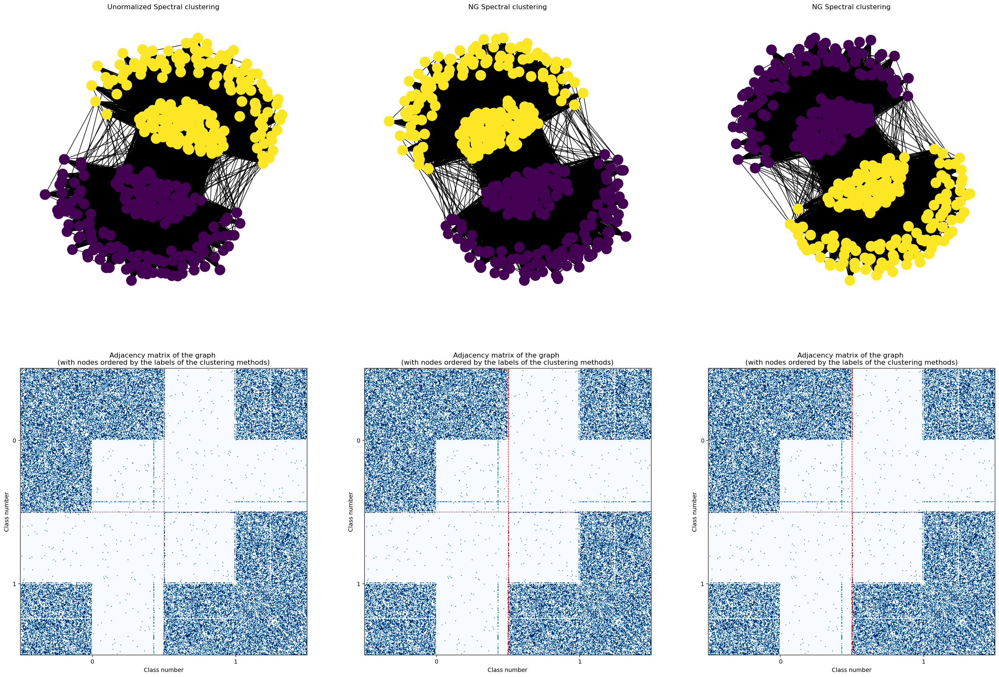

In [26]:
k = 2
labels_SC = SC(M, k)

plt.figure(figsize=(30,20))
plt.subplot(2,3,1)
nx.draw(nx.from_numpy_array(M), node_color=labels_SC)
plt.title("Unormalized Spectral clustering")

labels_NgSC = NgSC(M, k)
plt.subplot(2,3,2)
nx.draw(nx.from_numpy_array(M), node_color=labels_NgSC)
plt.title("NG Spectral clustering")

labels_AESC = AESC(M, k)
plt.subplot(2,3,3)
nx.draw(nx.from_numpy_array(M), node_color=labels_AESC)
plt.title("NG Spectral clustering")

sub_plot_adjacency_with_ordered_from_labels(M, labels_SC, (2,3,4))
sub_plot_adjacency_with_ordered_from_labels(M, labels_NgSC, (2,3,5))
sub_plot_adjacency_with_ordered_from_labels(M, labels_AESC, (2,3,6))
plt.show()

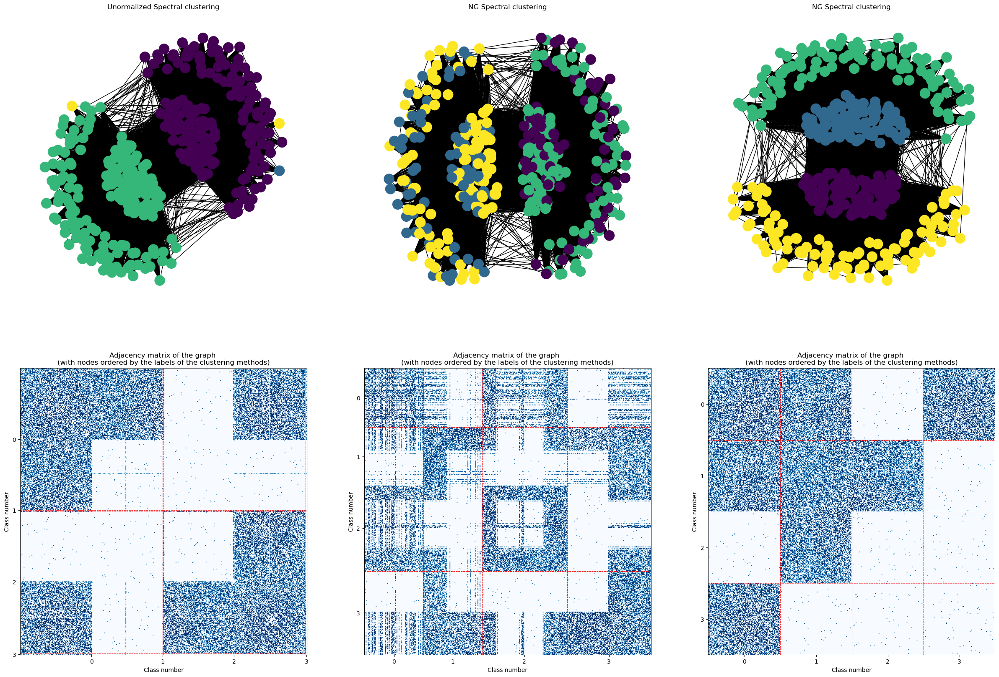

In [27]:
k = 4
labels_SC = SC(M, k)

plt.figure(figsize=(30,20))
plt.subplot(2,3,1)
nx.draw(nx.from_numpy_array(M), node_color=labels_SC)
plt.title("Unormalized Spectral clustering")

labels_NgSC = NgSC(M, k)
plt.subplot(2,3,2)
nx.draw(nx.from_numpy_array(M), node_color=labels_NgSC)
plt.title("NG Spectral clustering")

labels_AESC = AESC(M, k)
plt.subplot(2,3,3)
nx.draw(nx.from_numpy_array(M), node_color=labels_AESC)
plt.title("NG Spectral clustering")

sub_plot_adjacency_with_ordered_from_labels(M, labels_SC, (2,3,4))
sub_plot_adjacency_with_ordered_from_labels(M, labels_NgSC, (2,3,5))
sub_plot_adjacency_with_ordered_from_labels(M, labels_AESC, (2,3,6))
plt.show()

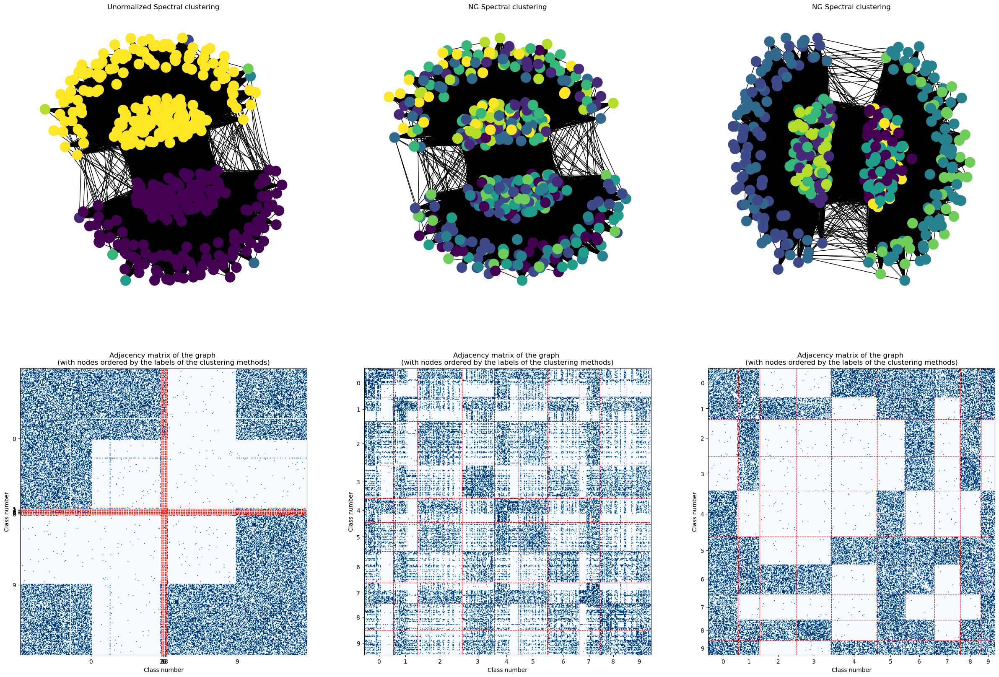

In [28]:
k = 10
labels_SC = SC(M, k)

plt.figure(figsize=(30,20))
plt.subplot(2,3,1)
nx.draw(nx.from_numpy_array(M), node_color=labels_SC)
plt.title("Unormalized Spectral clustering")

labels_NgSC = NgSC(M, k)
plt.subplot(2,3,2)
nx.draw(nx.from_numpy_array(M), node_color=labels_NgSC)
plt.title("NG Spectral clustering")

labels_AESC = AESC(M, k)
plt.subplot(2,3,3)
nx.draw(nx.from_numpy_array(M), node_color=labels_AESC)
plt.title("NG Spectral clustering")

sub_plot_adjacency_with_ordered_from_labels(M, labels_SC, (2,3,4))
sub_plot_adjacency_with_ordered_from_labels(M, labels_NgSC, (2,3,5))
sub_plot_adjacency_with_ordered_from_labels(M, labels_AESC, (2,3,6))
plt.show()

We see from the different spectral algorithms with different k that algorithm are design for the first definition of communities (SC) or the second definition (AESC). Their design greatly influence the cluster found thus it is important to know what should be retrieved before applying one.

number of classes detected 2


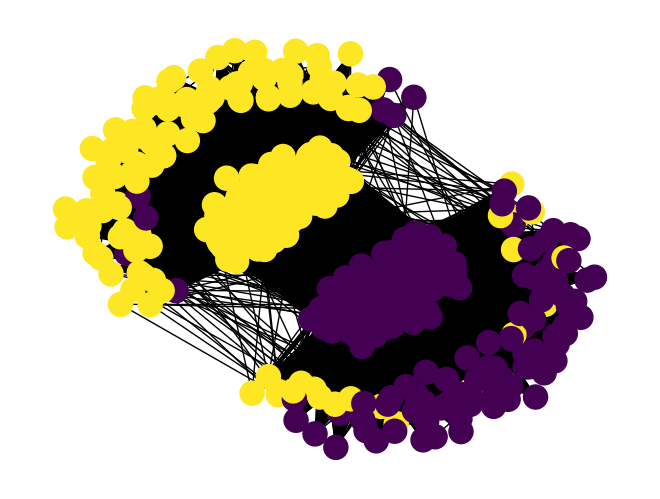

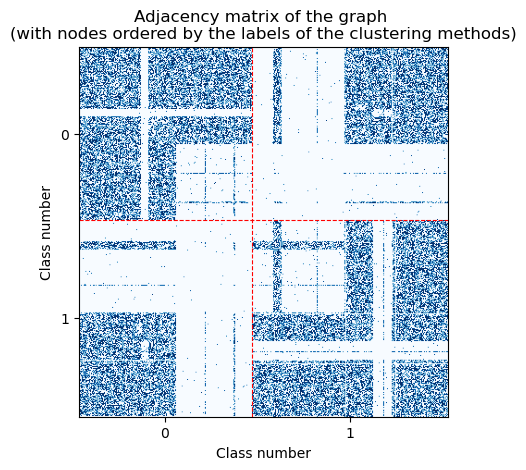

In [29]:
labels = MCL(M, 2, 2, 0.3)
plt.figure()
nx.draw(nx.from_numpy_array(M), node_color=labels)
print(f"number of classes detected {np.unique(labels).size}")

plot_adjacency_with_ordered_from_labels(M, labels)


number of classes detected 2


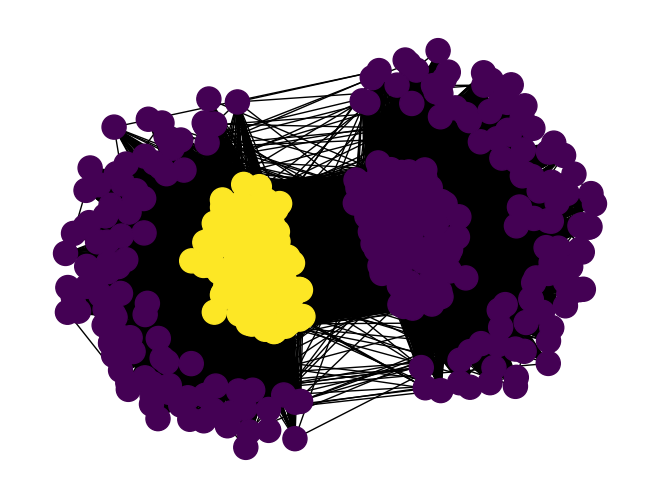

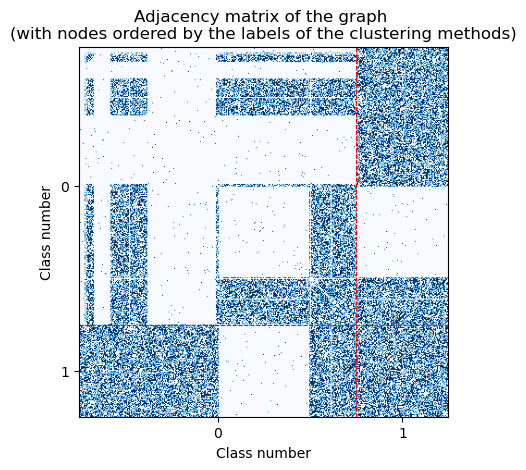

In [30]:
labels = MCL(M, 4, 6, 0.3)

print(f"number of classes detected {np.unique(labels).size}")

plt.figure()
nx.draw(nx.from_numpy_array(M), node_color=labels)
plot_adjacency_with_ordered_from_labels(M, labels)

number of classes detected 104


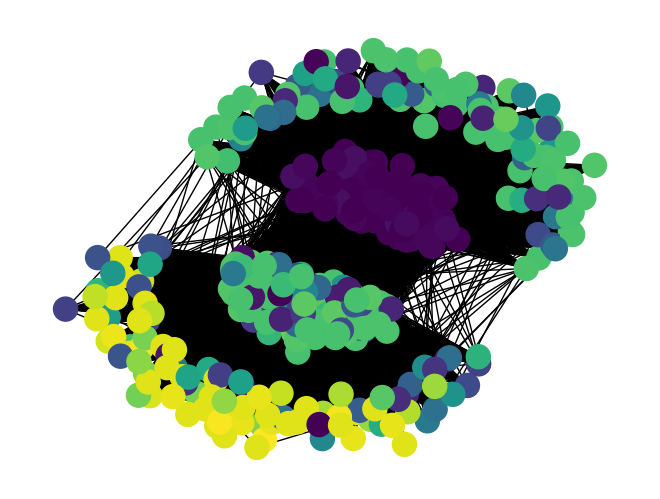

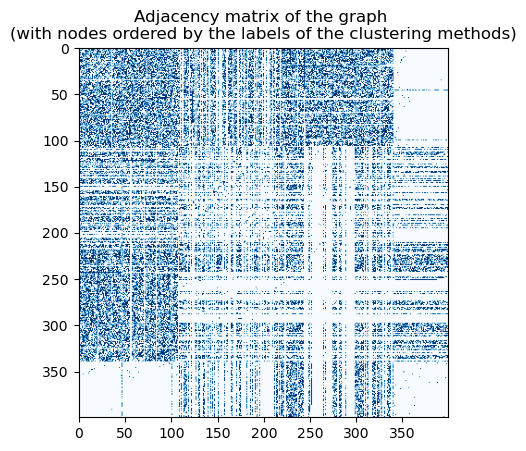

In [31]:
labels = MCL(M, 1, 0.01, 0.4)

print(f"number of classes detected {np.unique(labels).size}")

plt.figure()
nx.draw(nx.from_numpy_array(M), node_color=labels)
plot_adjacency_with_ordered_from_labels(M, labels, False)

With MCL we see that the algorithm is not easy to tune  and can provide very different results. However in theory it  can find the 2 definitions of communities.